# Assignment - 4

## Donal Loitam -  AI21BTECH11009

In [1]:
    %matplotlib inline

import time
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import math
import warnings
warnings.filterwarnings("ignore")

## Instructions
- For Q1, use images from University of Southern California’s image database at http://sipi.usc.edu/database/database.php?volume=misc.

- Please use the lighthouse.png and the template (template.png) uploaded along with this assignment for Q2 and Q3. 

## Helper functions
- From previous assignments

In [2]:
def gaussian_filter(sigma, M):

    filter_ = np.ones((M , M)) / (2 * np.pi * sigma**2)
    center = M // 2
    
    # Centering the gaussian filter
    for i in range(M):
        for j in range(M):
            filter_[i, j] *= np.exp(-((i - center) ** 2 + (j - center) ** 2) / (2 * sigma ** 2))
    
    filter_ /= np.sum(filter_)        # normalise
    
    return filter_  



def circular_conv(I, kernel, linear=False):
    
    I_height, I_width = I.shape
    kernel_height, kernel_width = kernel.shape
    
    # Flip the kernel both horizontally and vertically
    kernel = np.flipud(np.fliplr(kernel))
    
    result = np.zeros_like(I)
    
    pad_h = kernel_height // 2
    pad_w = kernel_width // 2
    
    # Circular convolution
    if not linear:                              
        # Pad the I using the 'wrap' mode for circular convolution
        padded_I = np.pad(I, ((pad_h, pad_h), (pad_w, pad_w)), mode='wrap')
        
        for i in range(I_height):
            for j in range(I_width):
                # Perform element-wise multiplication between the kernel and the region extracted
                region = padded_I[i:i+kernel_height, j:j+kernel_width]
                conv_result = np.sum(region * kernel)
                result[i, j] = conv_result
                
    # Linear convolution (with zero padding)
    else:                                                   
        # Pad the I using the 'constant' mode for linear convolution
        padded_I = np.pad(I, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
        
        for i in range(I_height):
            for j in range(I_width):
                # Perform element-wise multiplication between the kernel and the region extracted
                region = padded_I[i:i+kernel_height, j:j+kernel_width]
                conv_result = np.sum(region * kernel)
                result[i, j] = conv_result
    
    return result



def linear_conv_using_circular_conv(I , kernel):
    '''
        Performs linear convolution of image with a kernel via circular_conv .
    Args:
        I: The image
        kernel: The kernel

    Returns:
        The linearly convolved image
                                                                                                        '''
    return circular_conv(I , kernel, True)

In [3]:
## Load Images
lighthouse = np.array(Image.open('lighthouse.png').convert('L'))
template = np.array(Image.open('template.png').convert('L'))
I1 = plt.imread('5.1.13.tiff')
I2 = plt.imread('7.1.02.tiff')
I3 = plt.imread('5.1.11.tiff')

# Print the image shapes
print(I1.shape)
print(I2.shape)
print(I3.shape)
print(lighthouse.shape)
print(template.shape)

(256, 256)
(512, 512)
(256, 256)
(691, 691)
(64, 64)


# 1 Image Quality Assessment

### Ques
Q1. Write a Python function that accepts a pair of images of identical dimensions and computes the MSE and PSNR between them.

In [4]:
def calculate_MSE_PSNR(img1: np.ndarray, img2: np.ndarray):
    
    if img1.shape != img2.shape:
        raise ValueError("The two images should be of the same dimensions.")
    
    mse = np.mean((img1 - img2) ** 2)
    
    # If MSE is zero, PSNR is undefined, so we return infinity
    if mse == 0:
        psnr = np.inf
    else:
        max_pix_value = 255
        psnr = 10 * np.log10(max_pix_value * max_pix_value / mse)
    
    return mse, psnr

### Ques
Q2. Write a Python function that accepts a pair of images of identical dimensions and computes the
SSIM index between them. The function should return the mean SSIM (MSSIM) index as well as
the SSIM map. Use the definition of the SSIM index from the slides and use a Gaussian window for
the weighted mean, variance and covariance computations.

In [5]:
def calculate_SSIM(img1, img2):
    if img1.shape != img2.shape:
        raise ValueError("The two images should be of the same dimensions.")
        
    M, N = img1.shape
    
    # Get the gaussian window with the specified parameters
    win_size = 11
    sigma = 1
    gauss_window = gaussian_filter(sigma, win_size)
    
    # Define the constants, as per notes, assuming C3 = C2/2
    C1 = (0.01 * 255)**2
    C2 = (0.03 * 255)**2
    
    # Initialise the SSIM map
    SSIM_map = np.zeros((M, N))
    
    # We need to pad the image and use the padded image 
    pad_size = win_size - 1
    padded_img1 = np.zeros((M + 2 * pad_size, N + 2 * pad_size))
    padded_img2 = np.zeros((M + 2 * pad_size, N + 2 * pad_size))
    
    padded_img1[pad_size : M + pad_size, pad_size : N + pad_size] = img1
    padded_img2[pad_size : M + pad_size, pad_size : N + pad_size] = img2
    
    total_SSIM = 0
    
    # Extract patches and then calculate the relevant terms like local patch mean, std, sigma_correlation
    # Recall the simplification of the formula when you chose C3 = C2/2
    for i in range(M):
        for j in range(N):

            patch1 = padded_img1[i : i + win_size , j : j + win_size]
            patch2 = padded_img2[i : i + win_size , j : j + win_size]

            mu1 = np.sum(patch1 * gauss_window)
            mu2 = np.sum(patch2 * gauss_window)
            term1 = (2 * mu1 * mu2 + C1) / (mu1 ** 2  + mu2 ** 2 + C1)

            sigma1 = np.sqrt(np.sum(gauss_window * (patch1 - mu1)**2))
            sigma2 = np.sqrt(np.sum(gauss_window * (patch2 - mu2)**2))
            sigma_12 = np.sum(gauss_window * (patch1 - mu1) * (patch2 - mu2))
            term2 = (2 * sigma_12 + C2) / (sigma1 ** 2  + sigma2 ** 2 + C2)

            SSIM_ij = term1 * term2

            SSIM_map[i , j] = SSIM_ij
            total_SSIM += SSIM_ij
            
    mean_SSIM = total_SSIM / (M * N)
    
    return mean_SSIM, SSIM_map 

### Question
Q. Write a program to generate the following distortions:

    1. Mean shift by 16. (1)
    2. Additive white gaussian noise (AWGN) with standard deviation σ = 16. (1)
    3. JPEG compression at quality level 10. Use any open source Python library for this. (1)
    4. Gaussian blur using a 5×5 window with σ = 2. (1)

In [6]:
def mean_shift(I , amount=16):
    '''
    
    Args:
        I : the image to which noise has to be added
        amount: the amount by which mean should be shifted(16 by default)

    Returns:
        the New image with mean shifted 
                                                                                                        '''
    
    temp_I = I.copy().astype(np.int64)
    return np.clip(temp_I + amount, 0, 255)

In [7]:
def AWGN(I , mean = 0, std = 16):
    '''
        Adds white Gaussian noise (AWGN) with zero(by defualt) mean and standard deviation = std(16 by default)
    
    Args:
        I : the image to which noise has to be added
        mean : the mean of the noise, default is 0
        std : the standard deviation of the noise, default is 5

    Returns:
        the New image with noise added
                                                                                                        '''
    noisy_img = np.int64(I + np.random.normal(mean , std , I.shape))
    
    return np.clip(noisy_img, 0, 255)

In [8]:
def jpeg_compression(I, quality_level = 10):
    """
        Apply JPEG compression to an image I at a given quality level.
    
    Args:
        I: the image to be jpeg compressed
        quality_level : Quality level for jpeg compression (default = 10).
        
    Returns:
         Image array after applying JPEG compression.
                                                                                                                """
    
    # Convert PIL to np array if its PIL 
    if isinstance(I, Image.Image):
        I = np.array(I)                          
    
    output_I = Image.fromarray(I)                
    output_I.save("compressed.jpg", quality=quality_level)
    
    final_img = plt.imread("compressed.jpg")
    
    return final_img

In [9]:
def gaussian_blur(I, win_size = 5, sigma=2):
    # Generate a gaussian filter with specified sigma and window size
    gauss_filter = gaussian_filter(sigma, win_size)
    
    return linear_conv_using_circular_conv(I, gauss_filter)

### Question
Work with 3 images of your choice from the set mentioned in the instructions. Subject the images to the
distortions mentioned above. Compute the MSE, PSNR and SSIM index for each distortion. Also, rate the
images yourself (subjectively) using a continuous scale between 0 and 1. Compute the correlation between
your scores and PSNR, your scores and SSIM. What can you conclude about the two metrics?

In [10]:
def plot_image_with_metrics(img, distorted_img, distortion_name, distortion_parameters, self_rating, fig_text_1, fig_text_2):
    mse_val, psnr_val = calculate_MSE_PSNR(img, distorted_img)
    ssim_val = calculate_SSIM(img, distorted_img)[0]

    plt.imshow(distorted_img, cmap='gray')
    plt.axis('off')
    plt.title(distortion_name.format(*distortion_parameters))
    txt = "Self Rated: {}\nMSE: {:.2f}\nPSNR: {:.2f}\nSSIM: {:.2f}".format(self_rating, mse_val, psnr_val, ssim_val)
    plt.figtext(fig_text_1, fig_text_2, txt, horizontalalignment='center', fontsize=12)

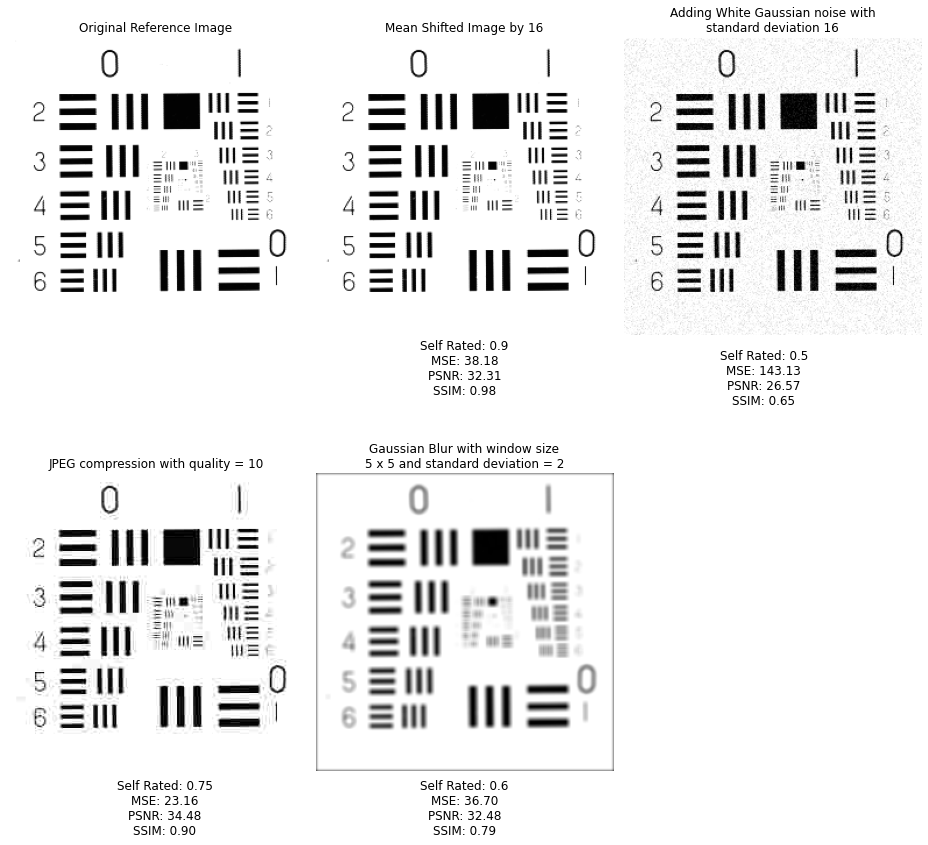

In [11]:
# For Image I1
mean_shift_img1 = mean_shift(I1, 16)
awgn_img1 = AWGN(I1, 0, 16)
jpeg_compressed_img1 = jpeg_compression(I1, 10)
gaussian_blurred_img1 = gaussian_blur(I1, 5, 2)

# Define your self ratings here after seeing picture
self_ratings1 = [0.9, 0.5, 0.75, 0.6]

plt.figure(figsize=(13, 13))

# Original Image
plt.subplot(2, 3, 1)
plt.imshow(I1, cmap='gray')
plt.axis('off')
plt.title("Original Reference Image")

# THE mean shifted image
plt.subplot(2, 3, 2)
plot_image_with_metrics(I1, mean_shift_img1, "Mean Shifted Image by {}", [16], self_ratings1[0], 0.5, 0.51)

# THE AWGN distorted image
plt.subplot(2, 3, 3)
plot_image_with_metrics(I1, awgn_img1, "Adding White Gaussian noise with\nstandard deviation {}", [16], self_ratings1[1], 0.82, 0.5)

# THE JPEG compressed image
plt.subplot(2, 3, 4)
plot_image_with_metrics(I1, jpeg_compressed_img1, "JPEG compression with quality = {}", [10], self_ratings1[2], 0.18, 0.04)

# THE Gaussian blurred image
plt.subplot(2, 3, 5)
plot_image_with_metrics(I1, gaussian_blurred_img1, "Gaussian Blur with window size\n5 x 5 and standard deviation = {}", [2], self_ratings1[3], 0.5, 0.04)

plt.tight_layout()
plt.show()


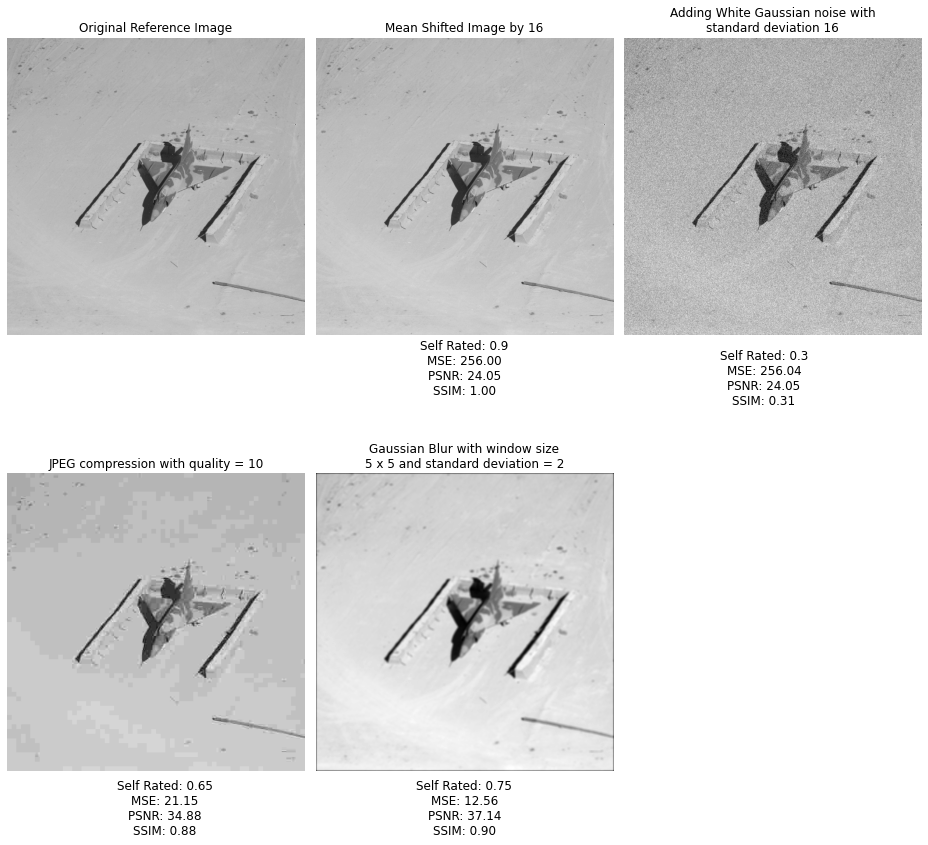

In [12]:
# For image I2
mean_shift_img2 = mean_shift(I2, 16)
awgn_img2 = AWGN(I2, 0, 16)
jpeg_compressed_img2 = jpeg_compression(I2, 10)
gaussian_blurred_img2 = gaussian_blur(I2, 5, 2)

# Define your self ratings here after seeing picture
self_ratings2 = [0.9, 0.3, 0.65, 0.75]

plt.figure(figsize=(13, 13))

# Original Image
plt.subplot(2, 3, 1)
plt.imshow(I2, cmap='gray')
plt.axis('off')
plt.title("Original Reference Image")

# Plot mean shifted image
plt.subplot(2, 3, 2)
plot_image_with_metrics(I2, mean_shift_img2, "Mean Shifted Image by {}", [16], self_ratings2[0], 0.5, 0.51)

# Plot AWGN distorted image
plt.subplot(2, 3, 3)
plot_image_with_metrics(I2, awgn_img2, "Adding White Gaussian noise with\nstandard deviation {}", [16], self_ratings2[1], 0.82, 0.5)

# Plot JPEG compressed image
plt.subplot(2, 3, 4)
plot_image_with_metrics(I2, jpeg_compressed_img2, "JPEG compression with quality = {}", [10], self_ratings2[2], 0.18, 0.04)

# Plot Gaussian blurred image
plt.subplot(2, 3, 5)
plot_image_with_metrics(I2, gaussian_blurred_img2, "Gaussian Blur with window size\n5 x 5 and standard deviation = {}", [2], self_ratings2[3], 0.5, 0.04)

plt.tight_layout()
plt.show()


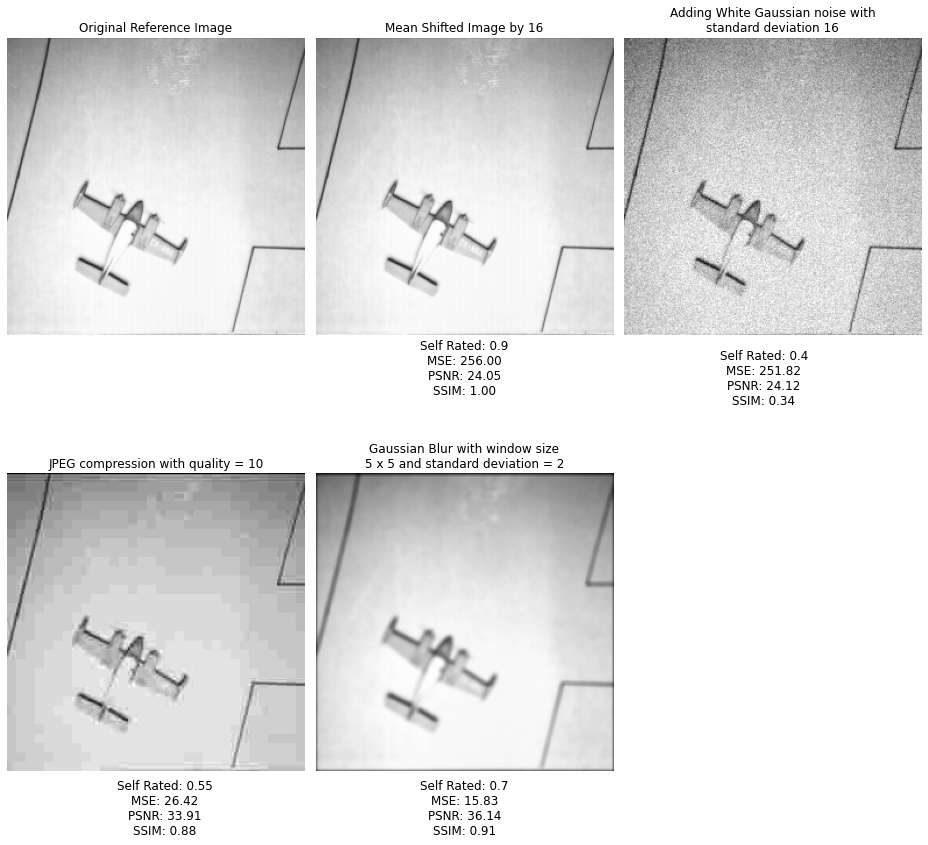

In [13]:
# For image I3
mean_shift_img3 = mean_shift(I3, 16)
awgn_img3 = AWGN(I3, 0, 16)
jpeg_compressed_img3 = jpeg_compression(I3, 10)
gaussian_blurred_img3 = gaussian_blur(I3, 5, 2)


# Define your self ratings here after seeing picture
self_ratings3 = [0.9, 0.4, 0.55, 0.7]

plt.figure(figsize=(13, 13))

# Original Image
plt.subplot(2, 3, 1)
plt.imshow(I3, cmap='gray')
plt.axis('off')
plt.title("Original Reference Image")

# Plot mean shifted image
plt.subplot(2, 3, 2)
plot_image_with_metrics(I3, mean_shift_img3, "Mean Shifted Image by {}", [16], self_ratings3[0], 0.5, 0.51)

# Plot AWGN distorted image
plt.subplot(2, 3, 3)
plot_image_with_metrics(I3, awgn_img3, "Adding White Gaussian noise with\nstandard deviation {}", [16], self_ratings3[1], 0.82, 0.5)

# Plot JPEG compressed image
plt.subplot(2, 3, 4)
plot_image_with_metrics(I3, jpeg_compressed_img3, "JPEG compression with quality = {}", [10], self_ratings3[2], 0.18, 0.04)

# Plot Gaussian blurred image
plt.subplot(2, 3, 5)
plot_image_with_metrics(I3, gaussian_blurred_img3, "Gaussian Blur with window size\n5 x 5 and standard deviation = {}", [2], self_ratings3[3], 0.5, 0.04)

plt.tight_layout()
plt.show()


### Ques:
Compute the correlation between your scores and PSNR, your scores and SSIM. What can you conclude about the two metrics?

In [14]:
self_ratings = self_ratings1 + self_ratings2 + self_ratings3 

psnr_scores = [calculate_MSE_PSNR(I1 , mean_shift_img1)[1] , calculate_MSE_PSNR(I1 , awgn_img1)[1] , calculate_MSE_PSNR(I1 , jpeg_compressed_img1)[1] ,calculate_MSE_PSNR(I1 , gaussian_blurred_img1)[1],
                calculate_MSE_PSNR(I2 , mean_shift_img2)[1] , calculate_MSE_PSNR(I2 , awgn_img2)[1] , calculate_MSE_PSNR(I2 , jpeg_compressed_img2)[1] ,calculate_MSE_PSNR(I2 , gaussian_blurred_img2)[1],
                calculate_MSE_PSNR(I3 , mean_shift_img3)[1] , calculate_MSE_PSNR(I3 , awgn_img3)[1] , calculate_MSE_PSNR(I3 , jpeg_compressed_img3)[1] ,calculate_MSE_PSNR(I3 , gaussian_blurred_img3)[1]]

ssim_scores = [calculate_SSIM(I1 , mean_shift_img1)[0] , calculate_SSIM(I1 , awgn_img1)[0] , calculate_SSIM(I1 , jpeg_compressed_img1)[0] ,calculate_SSIM(I1 , gaussian_blurred_img1)[0],
              calculate_SSIM(I2 , mean_shift_img2)[0] , calculate_SSIM(I2 , awgn_img2)[0] , calculate_SSIM(I2 , jpeg_compressed_img2)[0] ,calculate_SSIM(I2 , gaussian_blurred_img2)[0],
              calculate_SSIM(I3 , mean_shift_img3)[0] , calculate_SSIM(I3 , awgn_img3)[0] , calculate_SSIM(I3 , jpeg_compressed_img3)[0] ,calculate_SSIM(I3 , gaussian_blurred_img3)[0]]


print("The correlation matrix between Self Rated Scores and PSNR Scores is \n", np.corrcoef(self_ratings , psnr_scores))
print("The correlation matrix between Self Rated Scores and SSIM Scores is \n",np.corrcoef(self_ratings , ssim_scores))

The correlation matrix between Self Rated Scores and PSNR Scores is 
 [[1.         0.22424717]
 [0.22424717 1.        ]]
The correlation matrix between Self Rated Scores and SSIM Scores is 
 [[1.         0.90764729]
 [0.90764729 1.        ]]


### Observations
- We find a higher correlation(positive) between our self rated scores with SSIM(Structural Similarity Index Measure) as was discussed in class
- Conversely, there is a much lesser correlation between our self rated scores and PSNR 

# 2 Edge Detection

## 2.1 Gradient Edge Detectors (10)

1. Use the following gradient operators:

    (a) Centered 2-D differencing.
    (b) Roberts operator.
    (c) Prewitt operator.
    (d) Sobel operator.

In [15]:
def centered_2d_differencing(img):
    
    M, N = img.shape
    grad_x = np.zeros((M, N))
    grad_y = np.zeros((M, N))
    
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            grad_x[i, j] += 0.5 * img[i, j + 1] - 0.5 * img[i, j - 1] 
            grad_y[i, j] += 0.5 * img[i + 1, j] - 0.5 * img[i - 1, j] 
    
    grad_x = grad_x 
    grad_y = grad_y 
          
    return grad_x, grad_y

In [16]:
def roberts_operator(img):
    
    M, N = img.shape
    grad_x = np.zeros((M, N))
    grad_y = np.zeros((M, N))
    
    for i in range(1, M):
        for j in range(1, N):
            grad_x[i, j] += img[i, j] - img[i - 1, j - 1]
            grad_y[i, j] += img[i, j - 1] - img[i - 1, j] 
    
    grad_x = grad_x 
    grad_y = grad_y 
          
    return grad_x, grad_y

In [17]:
def prewitt_operator(img):
    
    M, N = img.shape
    grad_x = np.zeros((M, N))
    grad_y = np.zeros((M, N))
    
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            grad_x[i, j] += (img[i - 1, j + 1] + img[i, j + 1] + img[i + 1, j + 1])/3    # (j + 1) th column 
            grad_x[i, j] -= (img[i - 1, j - 1] + img[i, j - 1] + img[i + 1 , j - 1])/3   # (j - 1) th column

            grad_y[i, j] += (img[i + 1, j - 1] + img[i + 1, j] + img[i + 1, j + 1])/3    # (i + 1) th row
            grad_y[i, j] -= (img[i - 1, j - 1] + img[i - 1, j] + img[i - 1, j + 1])/3    # (i - 1) th row

    
    grad_x = grad_x 
    grad_y = grad_y 
          
    return grad_x, grad_y

In [18]:
def sobel_operator(img):
    
    M, N = img.shape
    grad_x = np.zeros((M, N))
    grad_y = np.zeros((M, N))
    
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            grad_x[i, j] += (img[i - 1, j + 1] + 2 * img[i, j + 1] + img[i + 1, j + 1])/4    # (j + 1) th column 
            grad_x[i, j] -= (img[i - 1, j - 1] + 2 * img[i, j - 1] + img[i + 1 , j - 1])/4   # (j - 1) th column

            grad_y[i, j] += (img[i + 1, j - 1] + 2 * img[i + 1, j] + img[i + 1, j + 1])/4    # (i + 1) th row
            grad_y[i, j] -= (img[i - 1, j - 1] + 2 * img[i - 1, j] + img[i - 1, j + 1])/4    # (i - 1) th row

    
    grad_x = grad_x 
    grad_y = grad_y 
          
    return grad_x, grad_y

2. Estimate gradient magnitude using the following definitions:

(a) M(i, j) = $\sqrt{∆^2_x(i, j) + ∆^2_y(i, j)}$

(b) M(i, j) = |$∆_x(i, j)$| + |$∆_y(i, j)$|

(c) M(i, j) = max{|$∆_x(i, j)$|, |$∆_y(i, j)$|}

In [19]:
def square_root_mag(grad_x, grad_y):
    return np.sqrt(grad_x ** 2 + grad_y ** 2)
    
    
def abs_mag(grad_x, grad_y):
    return np.abs(grad_x) + np.abs(grad_y)


def max_mag(grad_x, grad_y):   
    return np.maximum(np.abs(grad_x), np.abs(grad_y))

3. Threshold the magnitude map using an empirical threshold τ to find the edge map E.

In [20]:
def threshold_magnitude_map(grad_img, threshold):
    
    M, N = grad_img.shape
    edge_map = np.zeros((M, N))
    
    # Threshold the gradient magnitude map
    edge_map[grad_img > threshold] = 1
                
    return edge_map

## 2.2 Laplacian Edge Detectors (5)

### Questions
1. Compute the Laplacian using the convolution template.
2. Compute the edge map E as the output of a zero crossing detector.

In [21]:
def laplacian_filter(img):
    
    M, N = img.shape
    
    # Initialise the laplacian edge detector filter
    lap_kernel = np.ones((3, 3), dtype=np.int32)
    lap_kernel[1, 1] = -4
    lap_kernel[0, 0] = lap_kernel[0, 2] = lap_kernel[2, 0] = lap_kernel[2, 2] = 0  
    
    laplacian = np.zeros((M, N), dtype=np.float64)
    C = 1
    for c in range(C):
        laplacian += linear_conv_using_circular_conv(img, lap_kernel)
    
    return laplacian



def zero_crossing_detector(convolved_img):
    
    M, N = convolved_img.shape
    edge_map = np.zeros((M, N))
    
    for i in range(1, M - 1):
        for j in range(1, N - 1):
            if convolved_img[i, j] * convolved_img[i + 1, j] < 0:
                edge_map[i, j] = 1
                
            elif convolved_img[i, j] * convolved_img[i, j + 1] < 0:
                edge_map[i, j] = 1
                
            else: # convolved_img[i, j] = 0
                if convolved_img[i - 1, j] * convolved_img[i + 1, j] < 0:
                    edge_map[i, j] = 1

                elif convolved_img[i, j - 1] * convolved_img[i, j + 1] < 0:
                    edge_map[i, j] = 1
                
    return edge_map

## 2.3 Laplacian of Gaussian (LoG) (5)

LoG was motivated by the sensitivity of gradient and Laplacian edge detectors noise. In the problem,
you will implement an edge detector using the LoG operator. Work with the lighthouse.png image that is
corrupted with AWGN whose σn = 10. Experiment with different values of σ for the Gaussian pre-filter and
compute the edge map E after zero crossing detection. Compare your result with gradient based techniques
implemented above and verify the robustness of LoG.

In [22]:
def LoG(img, filter_size, sigma):

    M, N = img.shape
    
    # Define the LoG filter, with the parameters specified
    log_filter = np.ones((filter_size , filter_size)) / (-1 * np.pi * sigma**4)
    center = filter_size // 2

    # Centering the LoG filter
    for i in range(filter_size):
        for j in range(filter_size):
            log_filter[i, j] *= np.exp(-((i - center) ** 2 + (j - center) ** 2) / (2 * sigma ** 2))
            log_filter[i, j] *= (1 - ((i - center) ** 2 + (j - center) ** 2) / (2 * sigma ** 2))

    # Subtract mean
    log_filter -= np.mean(log_filter)

    
    # We need to pad the image and use the padded image 
    pad_size = filter_size - 1
    padded_img = np.zeros((M + 2 * pad_size, N + 2 * pad_size))
    padded_img[pad_size : M + pad_size, pad_size : N + pad_size] = img
    
    log_img = np.zeros((M, N))
    
#     for c in range(C):
    for i in range(M):
        for j in range(N):
            patch = padded_img[i : i + filter_size , j : j + filter_size]
            log_img[i , j] += np.sum(patch * log_filter)
    
#     log_img = log_img/C
    
    edge_map = zero_crossing_detector(log_img)

    return edge_map
    

## Edge detection Comparison
- Low Noise AWGN($\sigma=10$)
- Moderate Noise AWGN($\sigma=25$)
- High Noise AWGN($\sigma=80$)

In [23]:
def plot_edge_detection_results(image, title, edge_detector_func, i):
    plt.subplot(4, 4, i)
    edge_image = edge_detector_func(image)
    plt.imshow(edge_image, cmap='gray')
    plt.title(title)
    plt.axis('off')
    
    
# The gradient functions list
gradient_functions = {
    "Centered 2D Differencing with square magnitude": lambda x: square_root_mag(*centered_2d_differencing(x)),
    "Centered 2D Differencing with absolute magnitude": lambda x: abs_mag(*centered_2d_differencing(x)),
    "Centered 2D Differencing with maximum of absolute magnitude": lambda x: max_mag(*centered_2d_differencing(x)),
    "Roberts Operator with square magnitude": lambda x: square_root_mag(*roberts_operator(x)),
    "Roberts Operator with absolute magnitude": lambda x: abs_mag(*roberts_operator(x)),
    "Roberts Operator with maximum of absolute magnitude": lambda x: max_mag(*roberts_operator(x)),
    "Prewitt Operator with square magnitude": lambda x: square_root_mag(*prewitt_operator(x)),
    "Prewitt Operator with absolute magnitude": lambda x: abs_mag(*prewitt_operator(x)),
    "Prewitt Operator with maximum of absolute magnitude": lambda x: max_mag(*prewitt_operator(x)),
    "Sobel Operator with square magnitude": lambda x: square_root_mag(*sobel_operator(x)),
    "Sobel Operator with absolute magnitude": lambda x: abs_mag(*sobel_operator(x)),
    "Sobel Operator with maximum of absolute magnitude": lambda x: max_mag(*sobel_operator(x))
}

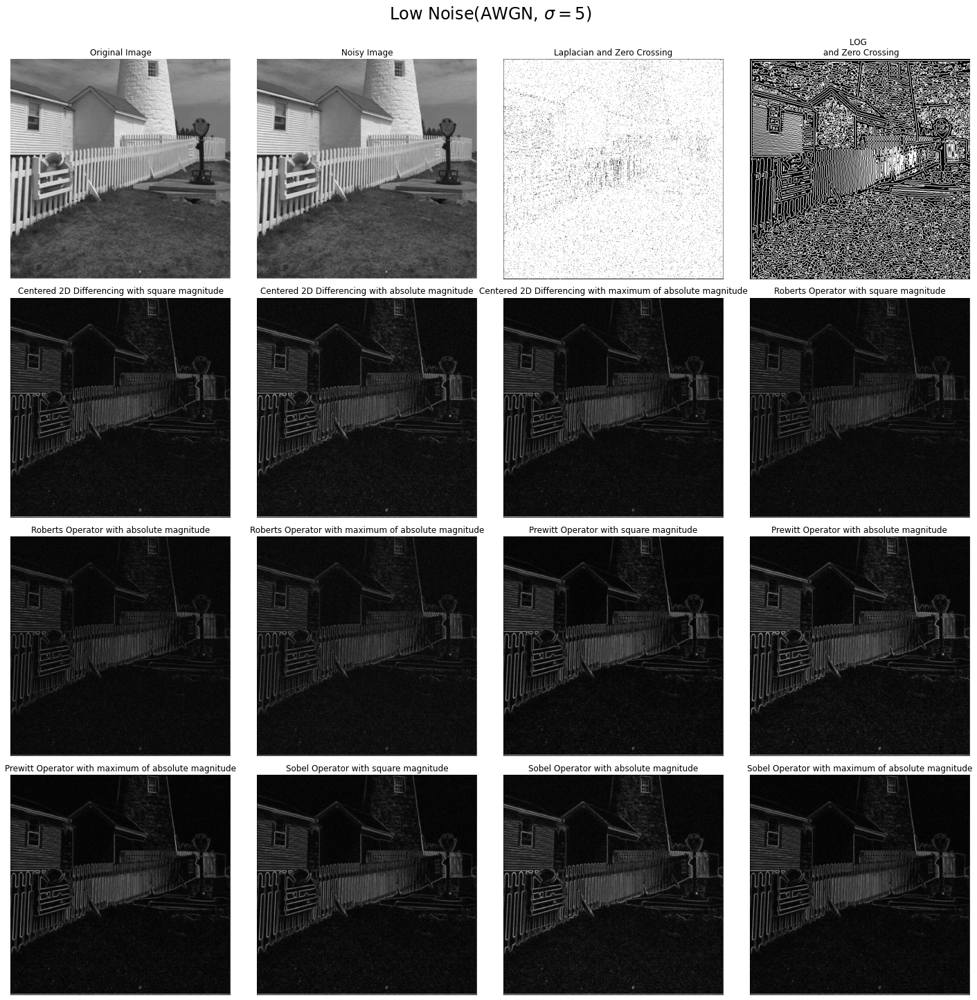

In [24]:
lighthouse_255 = np.clip(np.int64(lighthouse * 255) , 0 , 255)
lighthouse_255 = lighthouse

plt.figure(figsize=(20, 20))

plt.subplot(4, 4, 1)
plt.imshow(lighthouse_255, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Add some noise to the image
lighthouse_noise = AWGN(lighthouse_255, 0, 5)
plt.subplot(4, 4, 2)
plt.imshow(lighthouse_noise, cmap='gray')
plt.title("Noisy Image")
plt.axis('off')

# Laplacian and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "Laplacian and Zero Crossing", lambda x: zero_crossing_detector(laplacian_filter(x)), 3)

# LoG and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "LOG \n and Zero Crossing", lambda x: LoG(x, 11, 5), 4)

for i, (title, gradient_func) in enumerate(gradient_functions.items(), start=5):
    plot_edge_detection_results(lighthouse_noise, title, gradient_func, i)

    
plt.suptitle('Low Noise(AWGN, $\sigma = 5$)', fontsize=24, y=1)
plt.tight_layout()
plt.show()


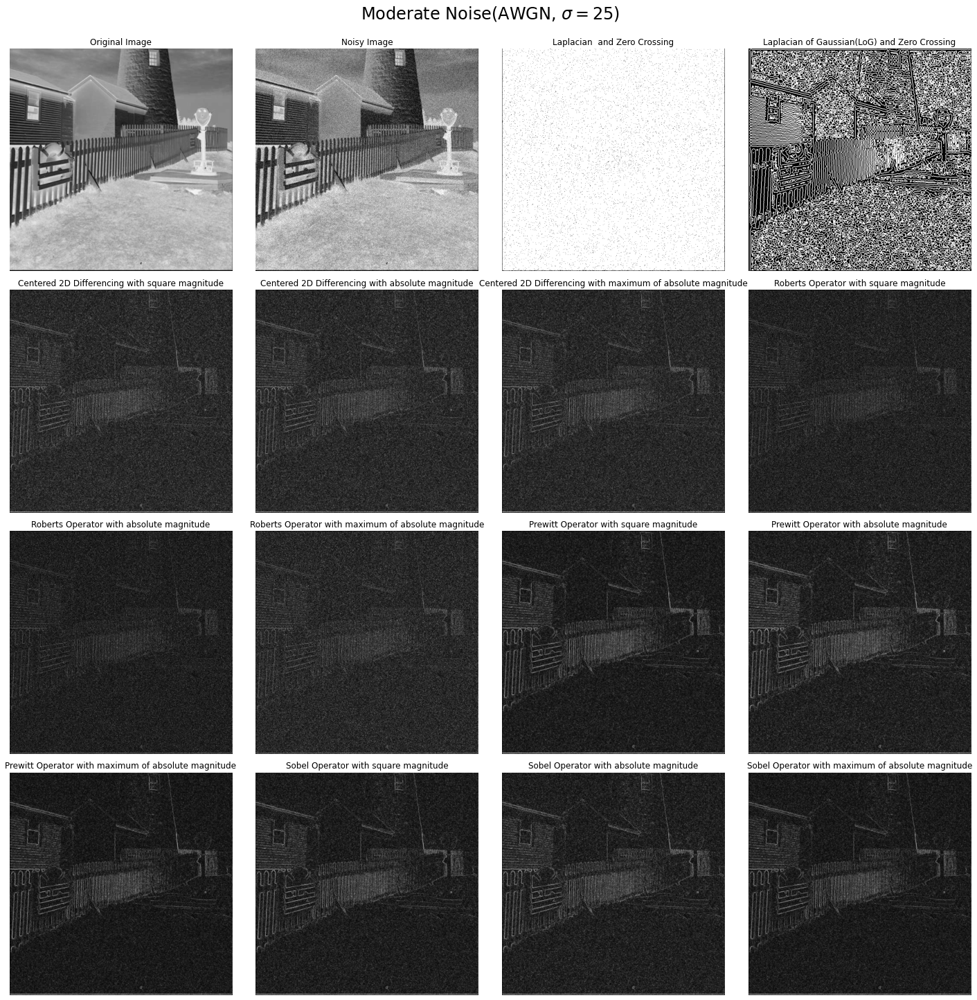

In [25]:
# Case 2:  More Noise
lighthouse_255 = np.clip(np.int64(lighthouse * 255) , 0 , 255)

plt.figure(figsize=(20, 20))

plt.subplot(4, 4, 1)
plt.imshow(lighthouse_255, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Add some more noise to the image(More Noisy Image)
lighthouse_noise = AWGN(lighthouse_255, 0, 25)
plt.subplot(4, 4, 2)
plt.imshow(lighthouse_noise, cmap='gray')
plt.title("Noisy Image")
plt.axis('off')

#  Laplacian and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "Laplacian  and Zero Crossing", lambda x: zero_crossing_detector(laplacian_filter(x)), 3)

# LoG and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "Laplacian of Gaussian(LoG) and Zero Crossing", lambda x: LoG(x, 11, 5), 4)


for i, (title, gradient_func) in enumerate(gradient_functions.items(), start=5):
    plot_edge_detection_results(lighthouse_noise, title, gradient_func, i)

    
plt.suptitle('Moderate Noise(AWGN, $\sigma = 25$)', fontsize=24, y=1)
plt.tight_layout()
plt.show()


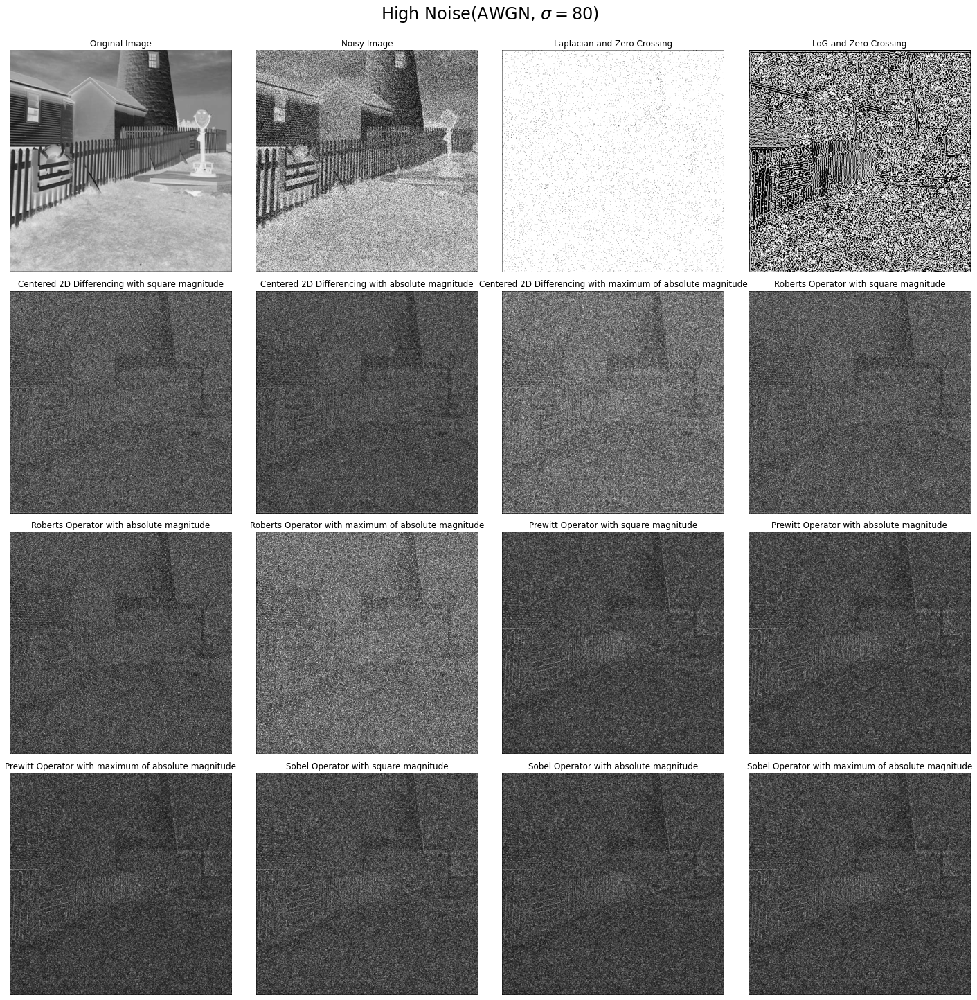

In [26]:
# Case 3:  High Noise
lighthouse_255 = np.clip(np.int64(lighthouse * 255) , 0 , 255)

plt.figure(figsize=(20, 20))

plt.subplot(4, 4, 1)
plt.imshow(lighthouse_255, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Add some more noise to the image(More Noisy Image)
lighthouse_noise = AWGN(lighthouse_255, 0, 80)
plt.subplot(4, 4, 2)
plt.imshow(lighthouse_noise, cmap='gray')
plt.title("Noisy Image")
plt.axis('off')

# Laplacian and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "Laplacian and Zero Crossing", lambda x: zero_crossing_detector(laplacian_filter(x)), 3)

# LoG and Zero Crossing
plot_edge_detection_results(lighthouse_noise, "LoG and Zero Crossing", lambda x: LoG(x, 11, 5), 4)


# Plot edge detection results using gradients
for i, (title, gradient_func) in enumerate(gradient_functions.items(), start=5):
    plot_edge_detection_results(lighthouse_noise, title, gradient_func, i)

plt.suptitle('High Noise(AWGN, $\sigma = 80$)', fontsize=24, y=1)
plt.tight_layout()
plt.show()


### Observations:(Robustness of LoG)
- Gradient based methods are effective in low noise conditions, does okay at moderate noise conditions
- Laplacian(which is based off 2nd derivatives) does okay at low noise conditions, but starts failing as noise increases
- While LoG method is comparatively more robust to noise as can be seen it still is able to detect edges at high noise conditions, while the others fail

In conclusion,(LoG) outperforms gradient-based methods in edge detection and noise handling, because of its combined Gaussian smoothing and Laplacian edge detection, resulting in superior edge detection quality.

### Experimenting with different values of sigma for the gaussian pre filter

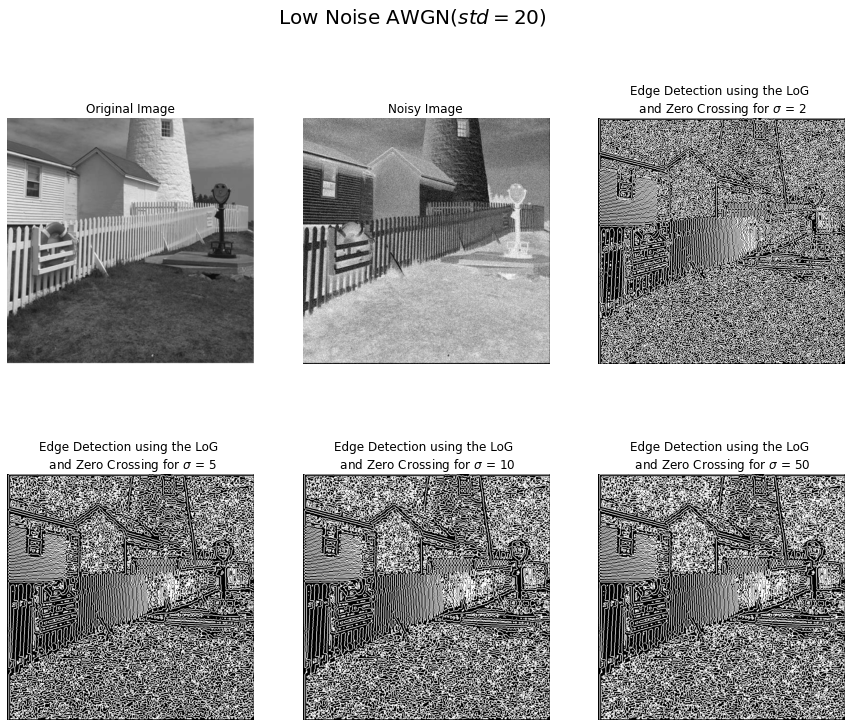

In [27]:
# Case 1: Low-Moderate Noise

lighthouse_noise = AWGN(lighthouse_255 , 0 , 20)

plt.figure(figsize = (15, 12))
plt.subplot(2 , 3 , 1)
plt.imshow(lighthouse , cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2 , 3 , 2)
plt.imshow(lighthouse_noise , cmap = 'gray')
plt.title("Noisy Image")
plt.axis('off')

sigmas = [2, 5, 10, 50]
filter_size = 11
i = 3

for sigma in sigmas:
    plt.subplot(2 , 3 , i)
    plt.imshow(LoG(lighthouse_noise , filter_size , sigma) , cmap = 'gray')
    sigma_value = str(sigma)
    plt.title("Edge Detection using the LoG \n and Zero Crossing for $\sigma$ = " + sigma_value)
    plt.axis('off')
    i += 1

plt.suptitle("Low Noise AWGN($std = 20$)", fontsize=20)
plt.show()

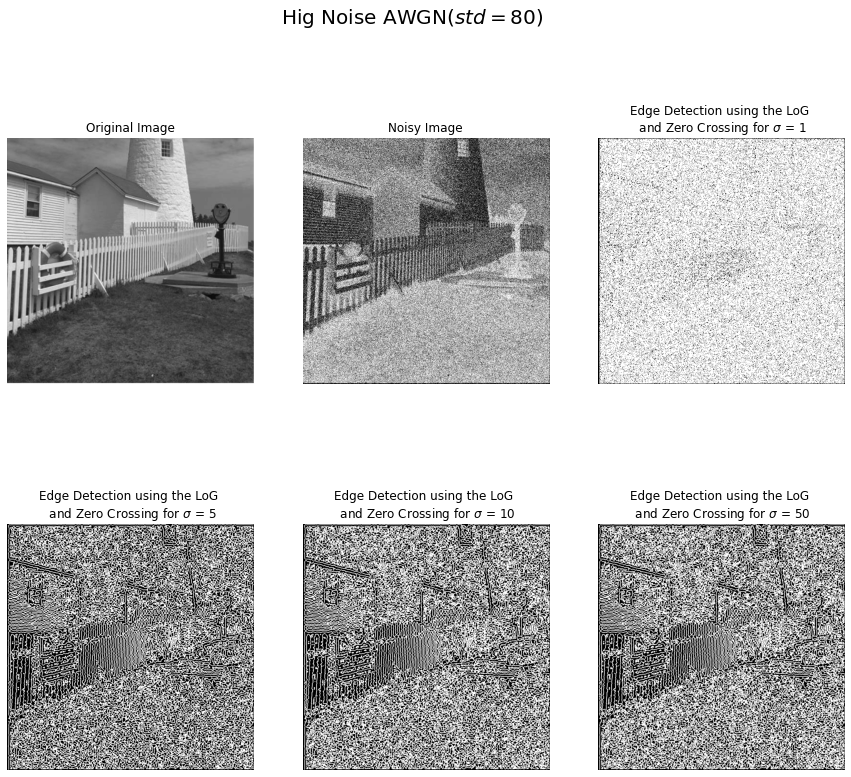

In [28]:
## Experimenting with different values of sigma for the gaussian pre filter
# Case 2: High Noise

lighthouse_noise = AWGN(lighthouse_255 , 0 , 80)

plt.figure(figsize = (15, 13))
plt.subplot(2 , 3 , 1)
plt.imshow(lighthouse , cmap = 'gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2 , 3 , 2)
plt.imshow(lighthouse_noise , cmap = 'gray')
plt.title("Noisy Image")
plt.axis('off')

sigmas = [1, 5, 10, 50]
filter_size = 11
i = 3

for sigma in sigmas:
    plt.subplot(2 , 3 , i)
    plt.imshow(LoG(lighthouse_noise , filter_size , sigma) , cmap = 'gray')
    sigma_value = str(sigma)
    plt.title("Edge Detection using the LoG \n and Zero Crossing for $\sigma$ = " + sigma_value)
    plt.axis('off')
    i += 1

plt.suptitle("Hig Noise AWGN($std = 80$)", fontsize=20)
plt.show()

### Observations
- Low Noise conditions
    - Smaller sigma values like $\sigma=2$ also does the job because there is less noise
    - Optimal sigma value is smaller(around 5) to maintain fine edge features while minimizing noise.
- High Noise conditions
    - Smaller sigma values can not detect edges because of the presence of noise.
    - Optimal sigma values seems to be larger(>5) to provide significant noise reduction while retaining essential edge features.

# 3 Template Matching (10)

1. Find the normalized cross correlation image.

In [29]:
def normalised_cross_correlation(img, template):
    
    M, N, C = img.shape
    M_template, N_template, C = template.shape
    
    norm_cross_corr_output = np.zeros((M, N))
    
    # Padding 
    pad_size1 = M_template - 1
    pad_size2 = N_template - 1
    
    padded_img = np.zeros((M +  pad_size1, N + pad_size2, C))
    padded_img[pad_size1: M + pad_size1, pad_size2: N + pad_size2, :] = img
    template_energy = np.sum(template ** 2)        # since this remains constant throughout
    
    for i in range(M):
        for j in range(N):
            img_patch = padded_img[i: i + M_template, j: j + N_template]
            corr_value = np.sum(img_patch * template)
            img_patch_energy = np.sum(img_patch ** 2)
            norm_cross_corr_output[i, j] = (corr_value * 255)/(np.sqrt(img_patch_energy * template_energy))
            
    return norm_cross_corr_output 




def threshold_matches(matched_image, threshold):
    """
    Threshold the matched image to identify matches above a certain threshold.

    Args:
        matched_image : The matched image via cross-correlation.
        threshold : The threshold value to determine matches.

    Returns:
        matched_indices_list : [(i, j)'s where matched_image[i, j] > threshold]
                                                                                                                        """
    
    matched_indices = np.argwhere(matched_image >= threshold)
    matched_indices_list = [(i, j) for i, j in matched_indices]

    return matched_indices_list

### Question
2. What is a good threshold to detect a match?

In [30]:
lighthouse = plt.imread('lighthouse.png')
template = plt.imread('template.png')
lighthouse_255 = np.clip(np.int64(lighthouse * 255) , 0 , 255)

The maximum value in the cross-correlation image corresponds to the location where the 
template best matches the original image. This value represents the highest similarity between the 
template and the corresponding region in the original image.
Because of some precision errors, the threshold would be a bit different. Hence, we will take the floor of the maximum value as our threshold.
The actual threshold outputed = 255.000006911054, chosen threshold = 255.0


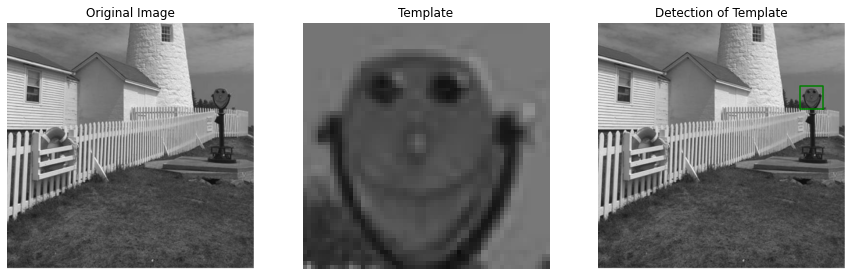

In [31]:
plt.figure(figsize=(15, 15))

plt.subplot(1, 3, 1)
plt.imshow(lighthouse_255, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(template, cmap='gray')
plt.title("Template")
plt.axis("off")

print("""The maximum value in the cross-correlation image corresponds to the location where the 
template best matches the original image. This value represents the highest similarity between the 
template and the corresponding region in the original image.""")
print("Because of some precision errors, the threshold would be a bit different. Hence, we will take the floor of the maximum value as our threshold.")

norm_cross_corr_img = normalised_cross_correlation(lighthouse_255, template)
maxi = np.max(norm_cross_corr_img)
threshold = np.floor(maxi)

print(f"The actual threshold outputed = {maxi}, chosen threshold = {threshold}")
matches = threshold_matches(norm_cross_corr_img, threshold)

# Plotting our detection 
plt.subplot(1, 3, 3)
plt.imshow(lighthouse_255, cmap='gray')
plt.title("Detection of Template")

# Using a Box to surround the detected template
h_template, w_template = template.shape[:2]
for match in matches:
    i, j = match
    x_coordinates = [j, j - w_template, j - w_template, j, j]
    y_coordinates = [i, i, i - h_template, i - h_template, i]

    # Plot the rectangle around the detected template using the x and y coordinates defined above
    plt.plot(x_coordinates, y_coordinates, 'g-')    


plt.axis('off')
plt.show()

### Question
3. Now add Gaussian noise to the template with $\sigma$ = 1, 3, 5, 10. Repeat steps (1) and (2) at each noise
level. How does the threshold change as noise increases?

For sigma = 1, The actual threshold outputed = 254.9941630631613, chosen threshold = 254.0
For sigma = 3, The actual threshold outputed = 254.95507231640056, chosen threshold = 254.0
For sigma = 5, The actual threshold outputed = 254.8755298049474, chosen threshold = 254.0
For sigma = 10, The actual threshold outputed = 254.50796146754755, chosen threshold = 254.0
For sigma = 20, The actual threshold outputed = 252.9627694992594, chosen threshold = 252.0


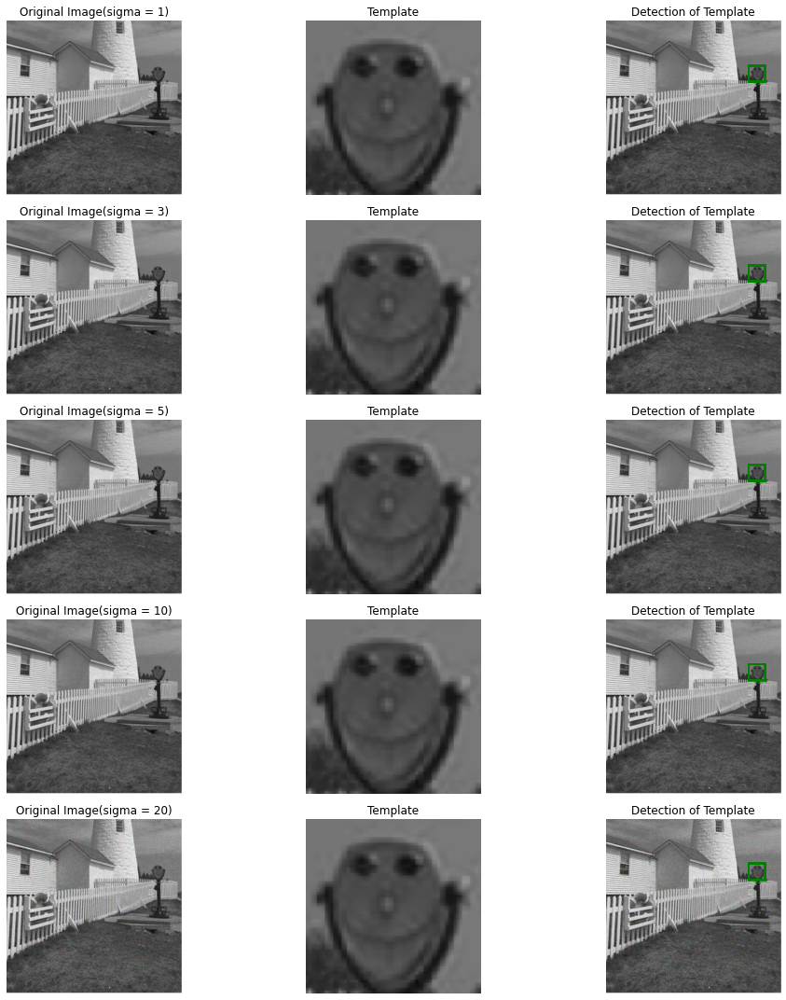


 Observe that the threshold decreases as the noise increases.


In [32]:
noise_list = [1 , 3 , 5 , 10, 20]
plt.figure(figsize=(15, 15))

for idx, noise in enumerate(noise_list):
    lighthouse_noise = AWGN(lighthouse_255 , 0 , noise)

    plt.subplot(5, 3, 3 * idx + 1)
    plt.imshow(lighthouse_noise, cmap='gray')
    plt.title(f"Original Image(sigma = {noise})")
    plt.axis("off")

    plt.subplot(5, 3, 3 * idx + 2)
    plt.imshow(template, cmap='gray')
    plt.title("Template")
    plt.axis("off")

    norm_cross_corr_img = normalised_cross_correlation(lighthouse_noise, template)
    maxi = np.max(norm_cross_corr_img)
    threshold = np.floor(maxi)

    print(f"For sigma = {noise}, The actual threshold outputed = {maxi}, chosen threshold = {threshold}")
    matches = threshold_matches(norm_cross_corr_img, threshold)

    # Plotting our detection 
    plt.subplot(5, 3, 3 * idx + 3)
    plt.imshow(lighthouse_noise, cmap='gray')
    plt.title("Detection of Template")
    
    # Using a Box to surround the detected template
    h_template, w_template = template.shape[:2]
    for match in matches:
        i, j = match
        x_coordinates = [j, j - w_template, j - w_template, j, j]
        y_coordinates = [i, i, i - h_template, i - h_template, i]

        # Plot the rectangle around the detected template using the x and y coordinates defined above
        plt.plot(x_coordinates, y_coordinates, 'g-') 
        plt.axis('off')

plt.tight_layout()
plt.show()
print("\n Observe that the threshold decreases as the noise increases.")

### Question

4. Rotate the image at the following angles θ = 5, 10, 15 degrees. Repeat steps (1) and (2) at each angle. How does the threshold change as rotation increases?

In [33]:
def rotate_image(img, theta):
    '''
        Rotates the given image by the given angle theta(in degrees)

    Args:
        img: The image to be rotated(RGB)
        theta: the angle by which image is to be rotated(in degrees)
        
    Returns:
        rot_img : the rot image
                                                                                                            '''
     
    if len(img.shape) != 3:
        raise ValueError("The first parameter 'img'(Image to be rotated) should be RGB!")
    
    M, N, C = img.shape

    # converting to radian
    theta = np.deg2rad(theta)

    rot_img = np.zeros_like(img) 
    rot_img[:, :, -1] = 255
    
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                                [np.sin(theta), np.cos(theta)]])

    for i in range(M):
        for j in range(N):
            rot_coord = np.dot(np.array([i , j], dtype = np.float64) , rotation_matrix)
            
            # Making sure that the rotated coordinates are within valid image dimensions
            if 0 <= rot_coord[0] < M and 0 <= rot_coord[1] < N:
                rot_img[int(rot_coord[0]), int(rot_coord[1]), :] = img[i, j, :]
    
    return np.clip(rot_img, 0, 255)

In [34]:
lighthouse = plt.imread('lighthouse.png')
template = plt.imread('template.png')
lighthouse_255 = np.clip(np.int64(lighthouse * 255) , 0 , 255)

For rotation angle = 5, The actual threshold outputed = 254.175619783704, chosen threshold = 254.0
For rotation angle = 10, The actual threshold outputed = 252.93733621352413, chosen threshold = 252.0
For rotation angle = 15, The actual threshold outputed = 251.53838869963914, chosen threshold = 251.0


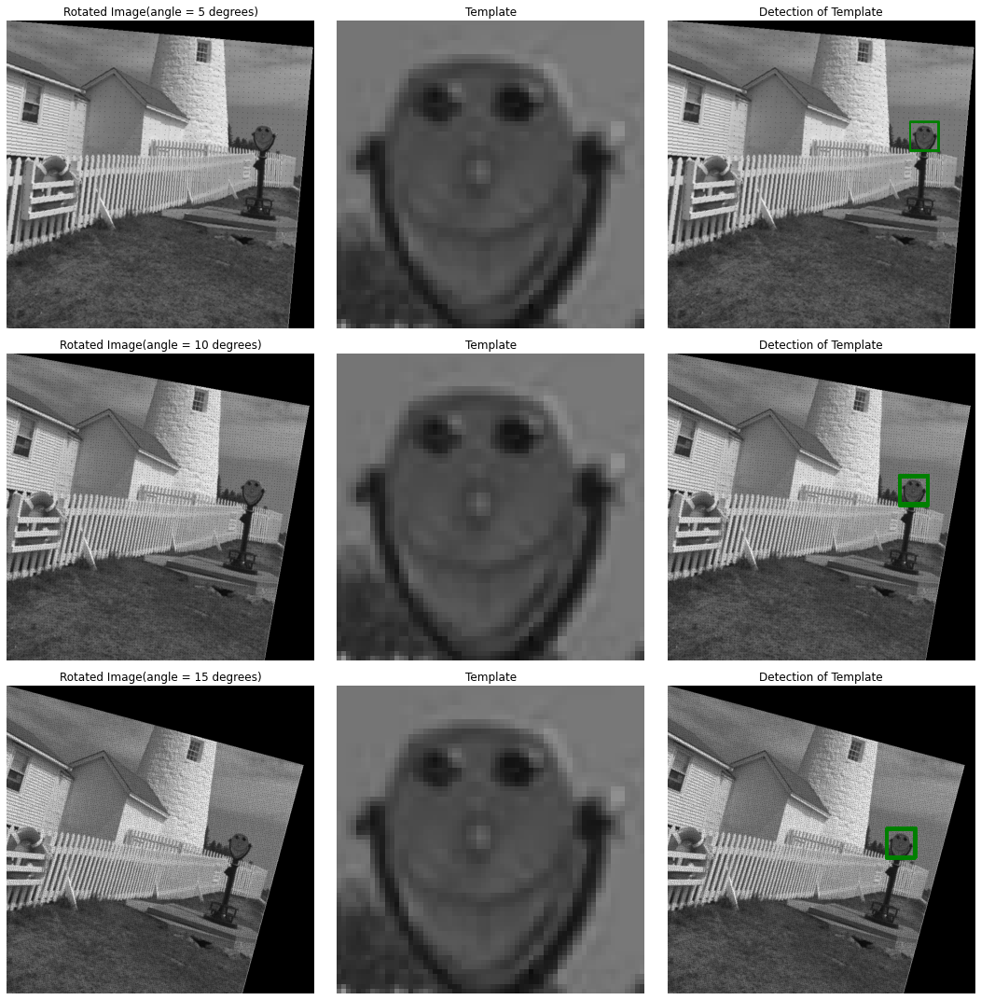


 Observe that the threshold decreases as the angle of rotation increases.


In [35]:
rotation_angle_list = [5 , 10 , 15]
ct = 1
plt.figure(figsize=(15, 15))

for angle in rotation_angle_list:
    lighthouse_rotated = rotate_image(lighthouse_255 , angle)

    plt.subplot(3, 3, ct)
    plt.imshow(lighthouse_rotated, cmap='gray')
    plt.title(f"Rotated Image(angle = {angle} degrees)")
    plt.axis("off")

    plt.subplot(3, 3, ct + 1)
    plt.imshow(template, cmap='gray')
    plt.title("Template")
    plt.axis("off")

    norm_cross_corr_img = normalised_cross_correlation(lighthouse_rotated, template)
    maxi = np.max(norm_cross_corr_img)
    threshold = np.floor(maxi)

    print(f"For rotation angle = {angle}, The actual threshold outputed = {maxi}, chosen threshold = {threshold}")
    matches = threshold_matches(norm_cross_corr_img, threshold)

    # Plotting our detection 
    plt.subplot(3, 3, ct + 2)
    plt.imshow(lighthouse_rotated, cmap='gray')
    plt.title("Detection of Template")

    # Using a Box to surround the detected template
    h_template, w_template = template.shape[:2]
    for match in matches:
        i, j = match
        x_coordinates = [j, j - w_template, j - w_template, j, j]
        y_coordinates = [i, i, i - h_template, i - h_template, i]

        # Plot the rectangle around the detected template using the x and y coordinates defined above
        plt.plot(x_coordinates, y_coordinates, 'g-') 
        plt.axis('off')

    ct = ct + 3

plt.tight_layout()
plt.show()
print("\n Observe that the threshold decreases as the angle of rotation increases.")